In [1]:
import os
# path to model downloads
os.environ["HF_HOME"] = "/pgeoprj/godeep/fuiw/cache/huggingface"

In [2]:
import numpy as np
import rp
import torch
import torch.nn as nn
import source.stable_diffusion as sd
from easydict import EasyDict
from source.learnable_textures import LearnableImageFourier
from source.stable_diffusion_labels import NegativeLabel
from itertools import chain
import time

/pgeoprj/godeep/fuiw/misc/diff-illusions-genai/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
from huggingface_hub import constants
print(constants.HF_HOME)
print(constants.HF_HUB_CACHE)

/pgeoprj/godeep/fuiw/cache/huggingface
/pgeoprj/godeep/fuiw/cache/huggingface/hub


In [4]:
#ONLY GOOD PROMPTS HERE
example_prompts = rp.load_yaml_file('source/example_prompts.yaml')
print('Available example prompts:', ', '.join(example_prompts))

#These prompts are all strings - you can replace them with whatever you want! By default it lets you choose from example prompts
#Here are some on the site! It does take some thought to come up with good ideas; the upside-down should look vaguely like the right-side up to work nicely
# prompt_a, prompt_b = rp.gather(example_prompts, 'victorial_dress victorial_dress'.split())
# prompts = rp.gather(example_prompts, 'moon pencil_cat_head pencil_dog_head'.split())
# prompts = rp.gather(example_prompts, 'moon pencil_cat_head pencil_dog_head'.split())
# prompts = rp.gather(example_prompts, 'botw_landscape mario mickey_mouse'.split())
# prompt_a, prompt_b = rp.gather(example_prompts, 'sailing_ship sailing_ship'.split())
prompts = [
    'Beautiful and detailed drawing of the moon',
    'Beautiful and detailed drawing of a cat',
    'Beautiful and detailed drawing of a dog',
]
# prompt_a = ''
negative_prompt = ''

print()
print('Negative prompt:',repr(negative_prompt))
print()
print('Chosen prompts:')
# print('    prompt_a =', repr(prompt_a)) #This will be right-side up
# print('    prompt_b =', repr(prompt_b)) #;This will be upside-down
print('    prompts =', repr(prompts)) #;This will be upside-down

Available example prompts: kitten_in_box, botw_landscape, magic_emma_watson, yorkshire_terrier_santa, norwegian_winter_girl, magic_forest_temple, sailing_ship, bioshock_lighthouse, two_bunnys_hugging, thomas_tank_military, wolf_on_rock, victorial_dress, lolita_dress_magical_elf, pencil_giraffe_head, pencil_penguin, pencil_violin, pencil_orca_whale, pencil_cow, pencil_walrus, pencil_cat_head, pencil_dog_head, ape_with_gun, human_skeleton, gold_coins, golf_ball_in_forest, bear_in_forest, elephant_in_circus, mickey_mouse, mushroom, mario, burger, darth_vader, gandalf, fantasy_city, green_elf_girl, pikachu, spring, fall, winter, summer, miku, pyramids, dinosaur, lipstick, picard, bull_wing, froggo, assasin_creed, moon, minecraft_zombie, pistol, disco_ball, volcano, porche, hawaii_beach, walter_white, dalek, tardis, tennant, weeping_angel

Negative prompt: ''

Chosen prompts:
    prompts = ['Beautiful and detailed drawing of the moon', 'Beautiful and detailed drawing of a cat', 'Beautiful a

In [5]:
if 's' not in dir():
    model_name="CompVis/stable-diffusion-v1-4"
    gpu='cuda:0'
    s=sd.StableDiffusion(gpu,model_name)
device=s.device

/pgeoprj/godeep/fuiw/misc/diff-illusions-genai/.venv/lib/python3.12/site-packages/diffusers/utils/deprecation_utils.py:23: FutureWarning: `torch_dtype` is deprecated and will be removed in version 1.0.0. Please use `dtype` instead.
  deprecate("torch_dtype", "1.0.0", _TORCH_DTYPE_DEPRECATION_MESSAGE)
Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


[INFO] sd.py: loading stable diffusion...please make sure you have run `huggingface-cli login`.


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 11.53it/s]


[INFO] sd.py: loaded stable diffusion!


In [6]:
# label_a = NegativeLabel(prompt_a,negative_prompt)
# label_b = NegativeLabel(prompt_b,negative_prompt)
labels = [NegativeLabel(p,negative_prompt) for p in prompts]

In [7]:
#Image Parametrization and Initialization (this section takes vram)

#Select Learnable Image Size (this has big VRAM implications!):
#Note: We use implicit neural representations for better image quality
#They're previously used in our paper "TRITON: Neural Neural Textures make Sim2Real Consistent" (see tritonpaper.github.io)
# ... and that representation is based on Fourier Feature Networks (see bmild.github.io/fourfeat)
learnable_image_maker = lambda: LearnableImageFourier(height=256, width=256, hidden_dim=256, num_features=128).to(s.device);
# learnable_image_maker = lambda: LearnableImageFourier(height=512,width=512,num_features=256,hidden_dim=256,scale=20).to(s.device);SIZE=512

image=learnable_image_maker()

In [8]:
def mirror_left(x):
    # Keep the left half, replace the right half with a mirror of the left
    W = x.shape[-1]
    keep = torch.arange(W, device=x.device) < (W + 1) // 2
    return torch.where(keep, x, x.flip(-1))

def mirror_right(x):
    # Keep the right half, replace the left half with a mirror of the right
    W = x.shape[-1]
    keep = torch.arange(W, device=x.device) >= W // 2
    return torch.where(keep, x, x.flip(-1))

learnable_image_a = lambda: image() 
learnable_image_b = lambda: mirror_left(image())   # Left side mirrored to the right
learnable_image_c = lambda: mirror_right(image())  # Right side mirrored to the left

optim = torch.optim.SGD(image.parameters(), lr=1e-4)

In [9]:
# labels=[label_a,label_b]
labels = [NegativeLabel(p,negative_prompt) for p in prompts]
learnable_images=[learnable_image_a,learnable_image_b,learnable_image_c]

#The weight coefficients for each prompt. For example, if we have [0,1], then only the upside-down mode will be optimized
# weights=[1]*len(learnable_images)
weights=[1,0.2,0.2]

assert len(labels) == len(learnable_images) and len(labels) == len(weights), 'Prompts, images and weights have different lengths'

weights=rp.as_numpy_array(weights)
weights=weights/weights.sum()
weights=weights*len(weights)

In [10]:
#For saving a timelapse
ims=[]

In [11]:
def get_display_image():
    return rp.tiled_images(
        [
            rp.as_numpy_image(learnable_image_a()),
            rp.as_numpy_image(learnable_image_b()),
            rp.as_numpy_image(learnable_image_c()),
        ],
        length=len(learnable_images),
        border_thickness=0,
    )

Every 200 iterations we display an image in the form [image_a, image_b], where
    image_a = (the right-side up image)
    image_b = (image_a, but upside down)

Interrupt the kernel at any time to return the currently displayed image
You can run this cell again to resume training later on

Please expect this to take quite a while to get good images (especially on the slower Colab GPU's)! The longer you wait the better they'll be


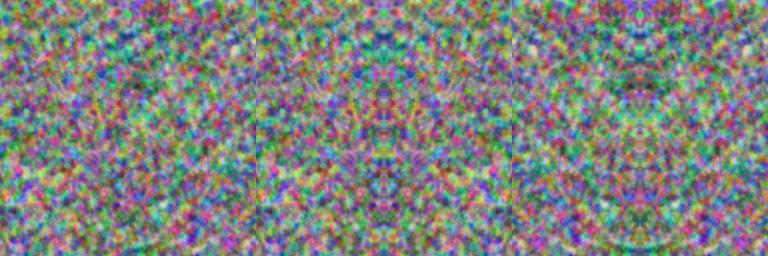

Status: ETR=0:20:59.495673      ETA=0:21:25.199666      T=0:00:25.703993        Progress: 200/10000     RATE=7.78/s

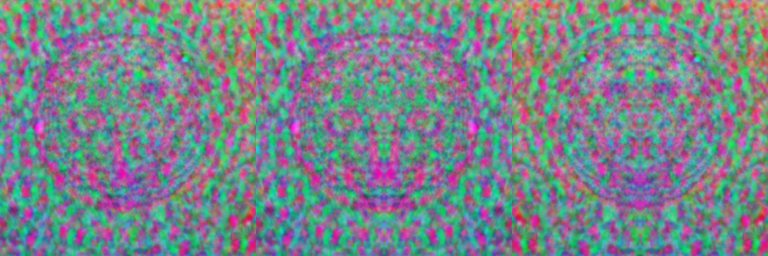

Status: ETR=0:20:21.419020      ETA=0:21:12.311479      T=0:00:50.892459        Progress: 400/10000     RATE=7.86/s

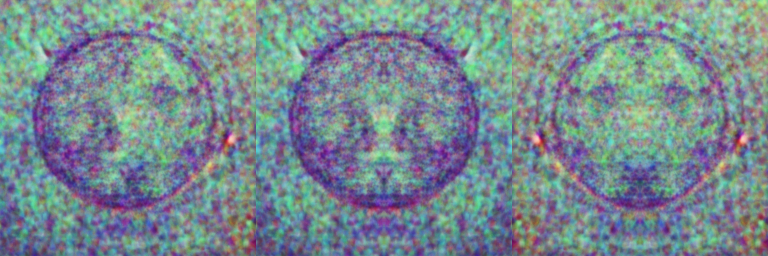

Status: ETR=0:19:52.094669      ETA=0:21:08.185818      T=0:01:16.091149        Progress: 600/10000     RATE=7.89/s

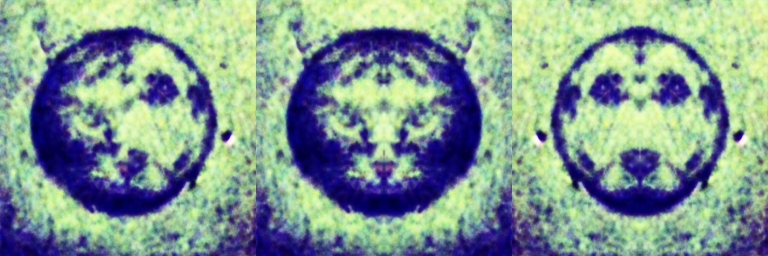

Status: ETR=0:19:24.785869      ETA=0:21:06.071597      T=0:01:41.285728        Progress: 800/10000     RATE=7.90/s

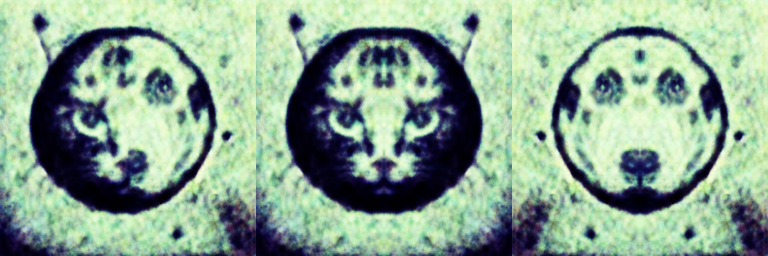

Status: ETR=0:18:58.401057      ETA=0:21:04.890063      T=0:02:06.489006        Progress: 1000/10000    RATE=7.91/s

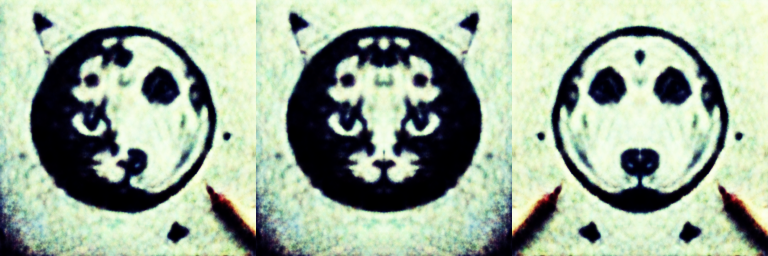

Status: ETR=0:18:32.361125      ETA=0:21:04.046733      T=0:02:31.685608        Progress: 1200/10000    RATE=7.91/s

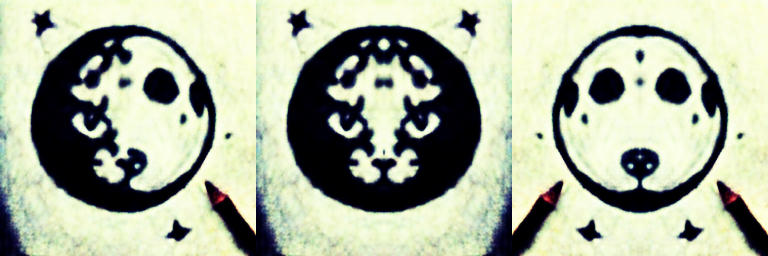

Status: ETR=0:18:06.573845      ETA=0:21:03.457959      T=0:02:56.884114        Progress: 1400/10000    RATE=7.91/s

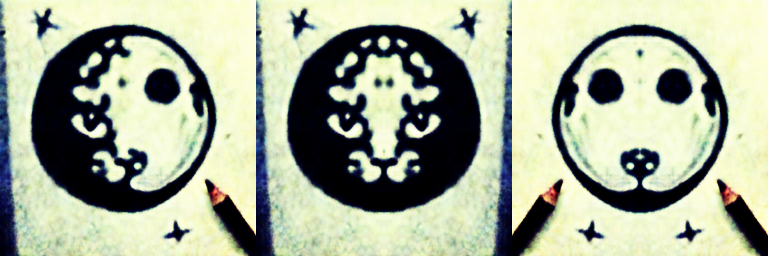

Status: ETR=0:17:40.989394      ETA=0:21:03.082612      T=0:03:22.093218        Progress: 1600/10000    RATE=7.92/s

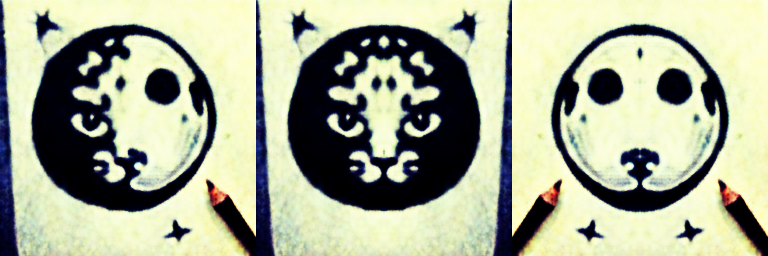

Status: ETR=0:17:15.546256      ETA=0:21:02.861288      T=0:03:47.315032        Progress: 1800/10000    RATE=7.92/s

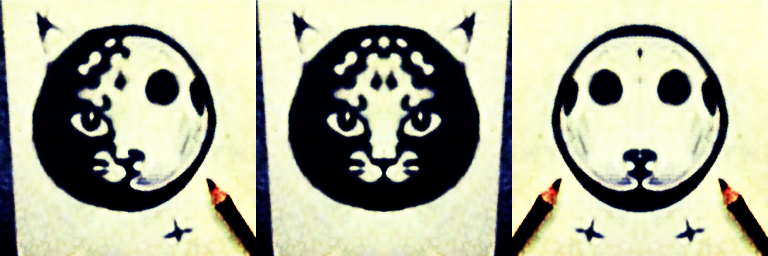

Status: ETR=0:16:50.150919      ETA=0:21:02.688649      T=0:04:12.537730        Progress: 2000/10000    RATE=7.92/s

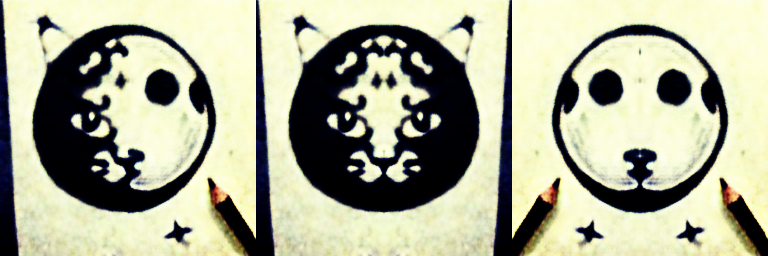

Status: ETR=0:16:24.794513      ETA=0:21:02.557068      T=0:04:37.762555        Progress: 2200/10000    RATE=7.92/s

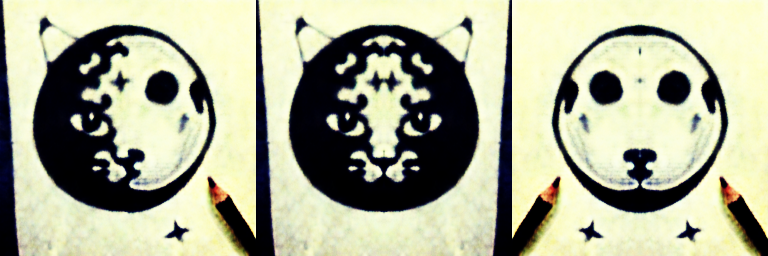

Status: ETR=0:15:59.471318      ETA=0:21:02.462260      T=0:05:02.990942        Progress: 2400/10000    RATE=7.92/s

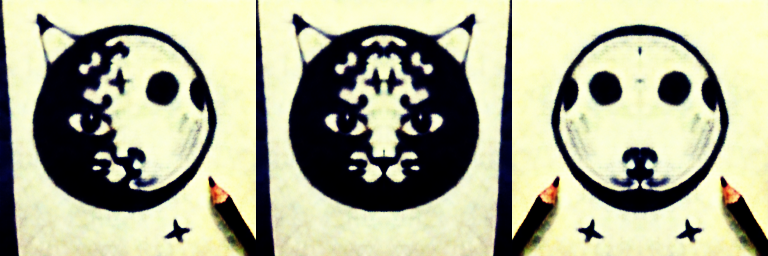

Status: ETR=0:15:34.130506      ETA=0:21:02.338522      T=0:05:28.208016        Progress: 2600/10000    RATE=7.92/s

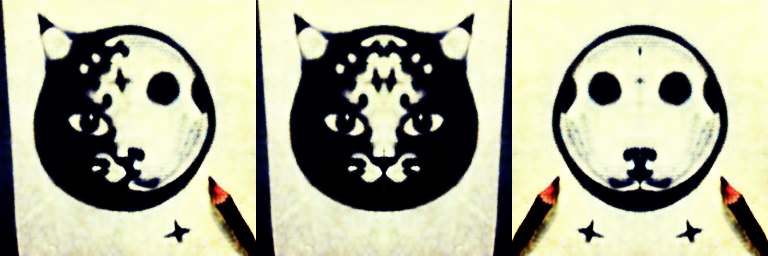

Status: ETR=0:15:08.775121      ETA=0:21:02.187668      T=0:05:53.412547        Progress: 2800/10000    RATE=7.92/s

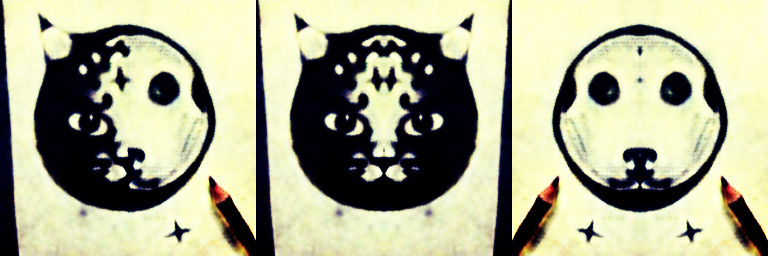

Status: ETR=0:14:43.484457      ETA=0:21:02.120652      T=0:06:18.636196        Progress: 3000/10000    RATE=7.92/s

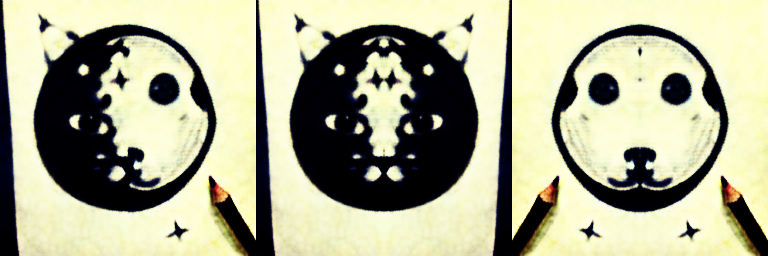

Status: ETR=0:14:18.188540      ETA=0:21:02.041971      T=0:06:43.853431        Progress: 3200/10000    RATE=7.92/s

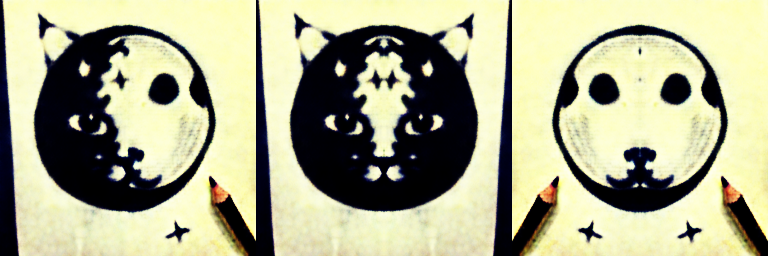

Status: ETR=0:13:52.911244      ETA=0:21:01.986733      T=0:07:09.075489        Progress: 3400/10000    RATE=7.92/s

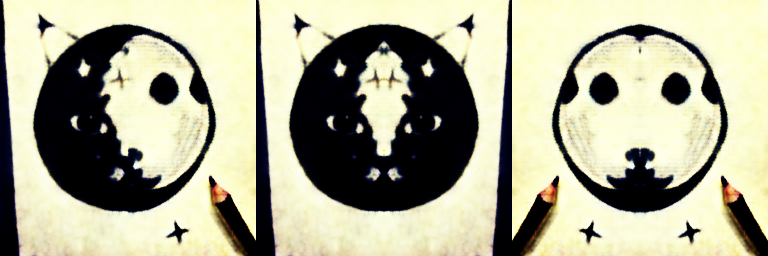

Status: ETR=0:13:27.655868      ETA=0:21:01.962294      T=0:07:34.306426        Progress: 3600/10000    RATE=7.92/s

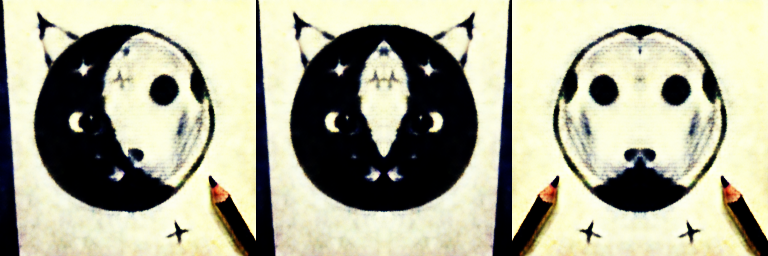

Status: ETR=0:13:02.386006      ETA=0:21:01.912914      T=0:07:59.526907        Progress: 3800/10000    RATE=7.92/s

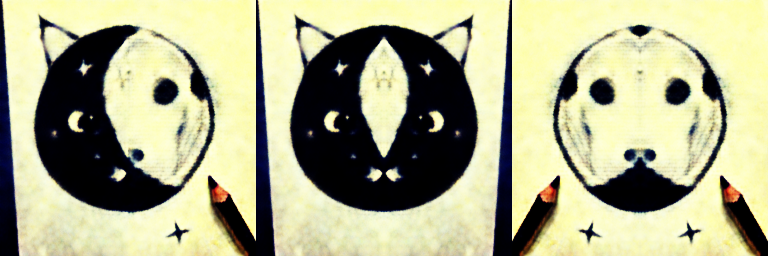

Status: ETR=0:12:37.129275      ETA=0:21:01.882125      T=0:08:24.752850        Progress: 4000/10000    RATE=7.92/s

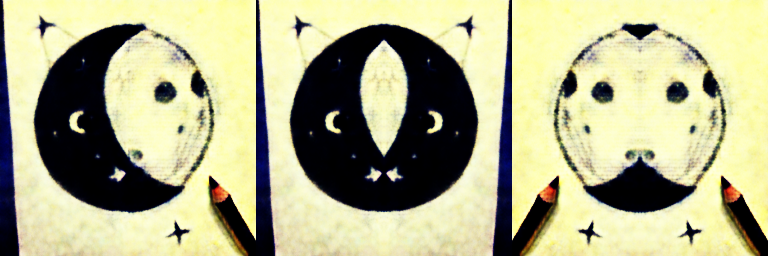

Status: ETR=0:12:11.887056      ETA=0:21:01.874234      T=0:08:49.987178        Progress: 4200/10000    RATE=7.92/s

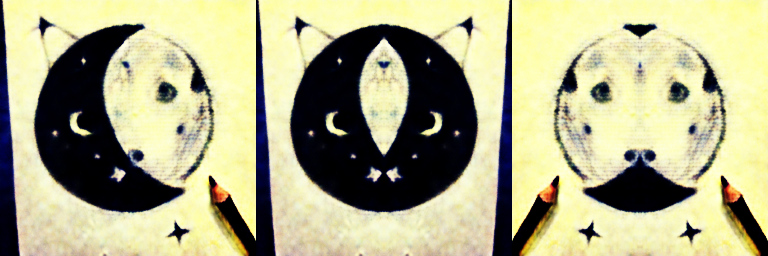

Status: ETR=0:11:46.632523      ETA=0:21:01.843792      T=0:09:15.211268        Progress: 4400/10000    RATE=7.92/s

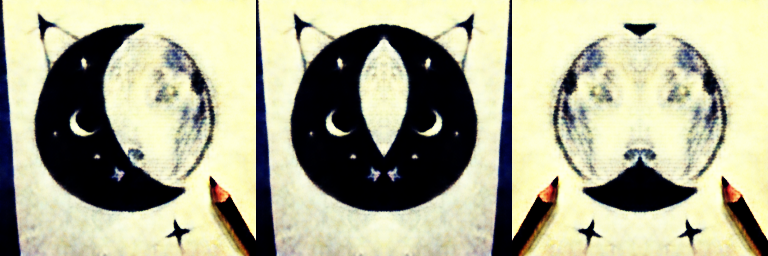

Status: ETR=0:11:21.380492      ETA=0:21:01.815726      T=0:09:40.435234        Progress: 4600/10000    RATE=7.93/s

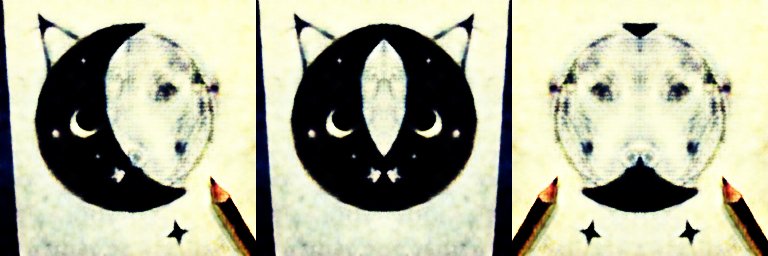

Status: ETR=0:10:56.129279      ETA=0:21:01.787076      T=0:10:05.657796        Progress: 4800/10000    RATE=7.93/s

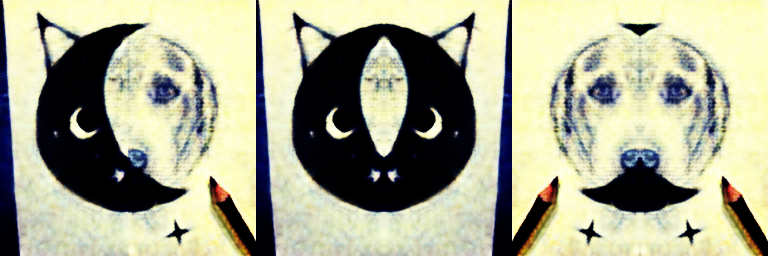

Status: ETR=0:10:30.880998      ETA=0:21:01.761995      T=0:10:30.880998        Progress: 5000/10000    RATE=7.93/s

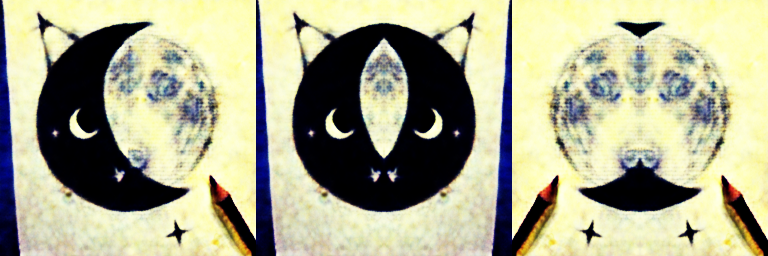

Status: ETR=0:10:05.642290      ETA=0:21:01.754771      T=0:10:56.112481        Progress: 5200/10000    RATE=7.93/s

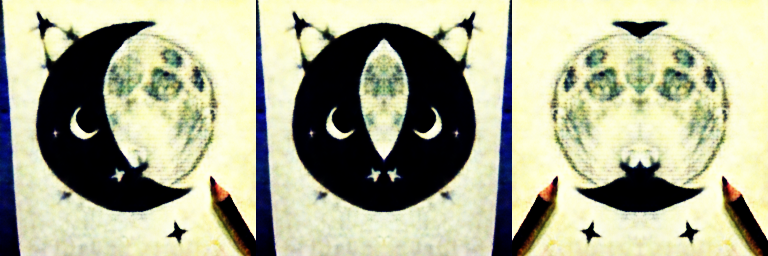

Status: ETR=0:09:40.396461      ETA=0:21:01.731438      T=0:11:21.334976        Progress: 5400/10000    RATE=7.93/s

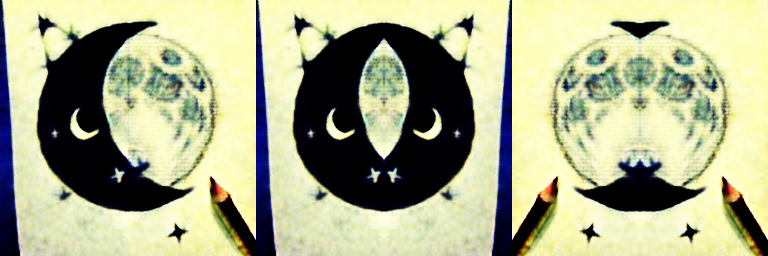

Status: ETR=0:09:15.151756      ETA=0:21:01.708535      T=0:11:46.556780        Progress: 5600/10000    RATE=7.93/s

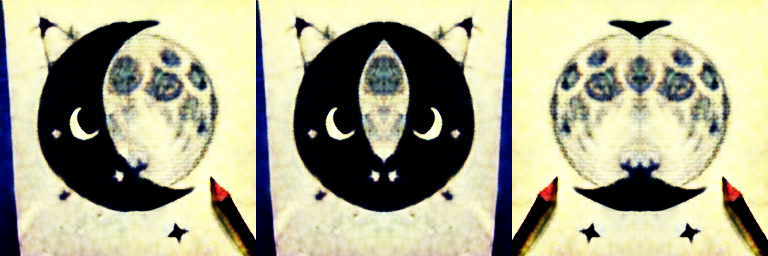

Status: ETR=0:08:49.917826      ETA=0:21:01.709110      T=0:12:11.791284        Progress: 5800/10000    RATE=7.93/s

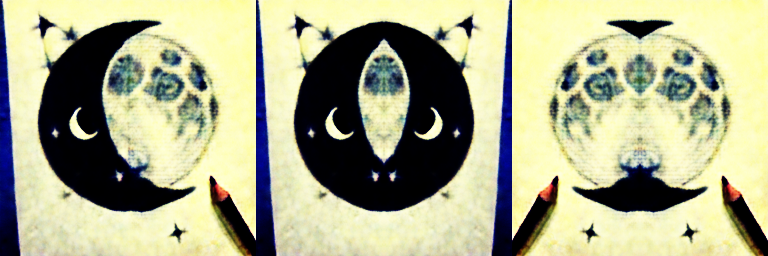

Status: ETR=0:08:24.677399      ETA=0:21:01.693497      T=0:12:37.016098        Progress: 6000/10000    RATE=7.93/s

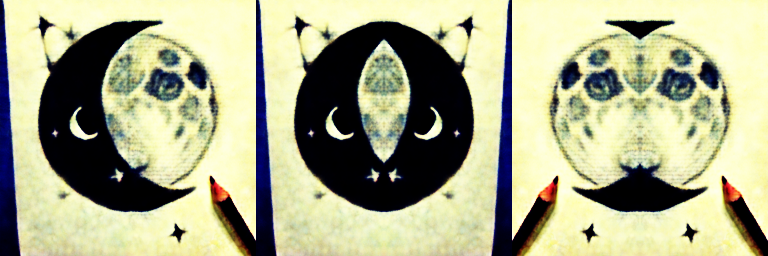

Status: ETR=0:07:59.434742      ETA=0:21:01.670374      T=0:13:02.235632        Progress: 6200/10000    RATE=7.93/s

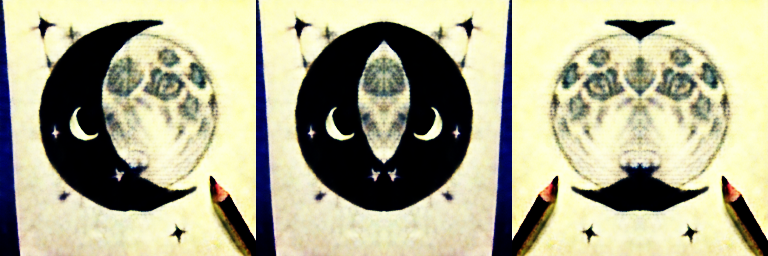

Status: ETR=0:07:34.195417      ETA=0:21:01.653936      T=0:13:27.458519        Progress: 6400/10000    RATE=7.93/s

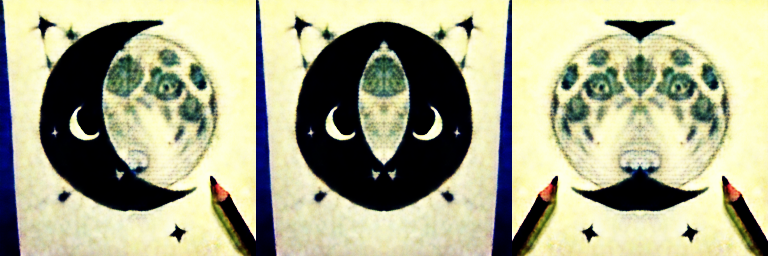

Status: ETR=0:07:08.959163      ETA=0:21:01.644597      T=0:13:52.685434        Progress: 6600/10000    RATE=7.93/s

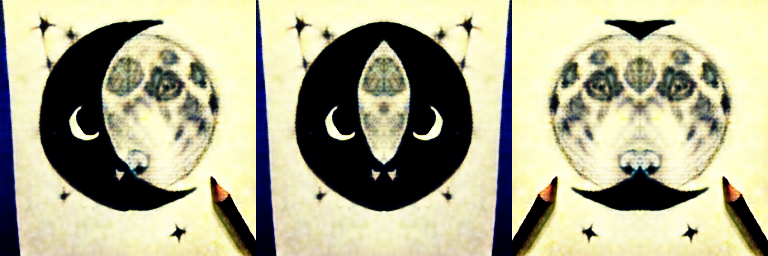

Status: ETR=0:06:43.727595      ETA=0:21:01.648733      T=0:14:17.921139        Progress: 6800/10000    RATE=7.93/s

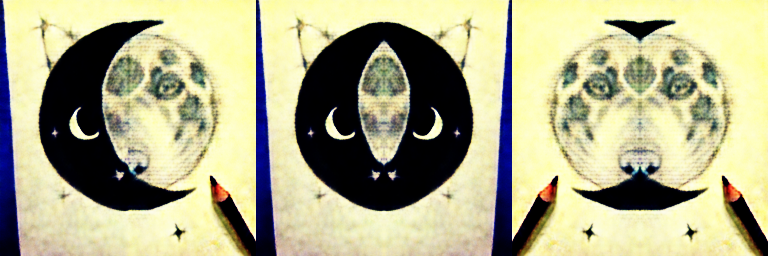

Status: ETR=0:06:18.489083      ETA=0:21:01.630277      T=0:14:43.141194        Progress: 7000/10000    RATE=7.93/s

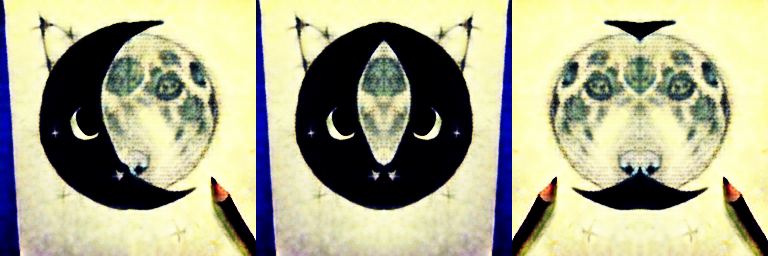

Status: ETR=0:05:53.254698      ETA=0:21:01.623923      T=0:15:08.369224        Progress: 7200/10000    RATE=7.93/s

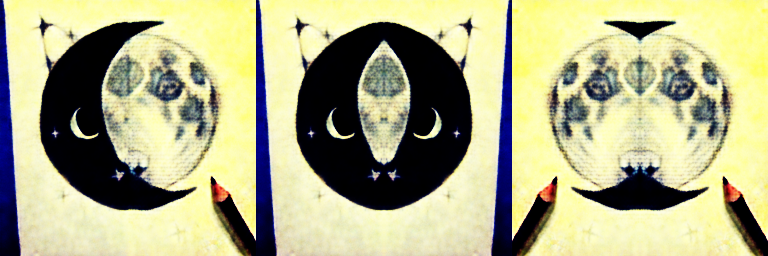

Status: ETR=0:05:28.018207      ETA=0:21:01.608489      T=0:15:33.590282        Progress: 7400/10000    RATE=7.93/s

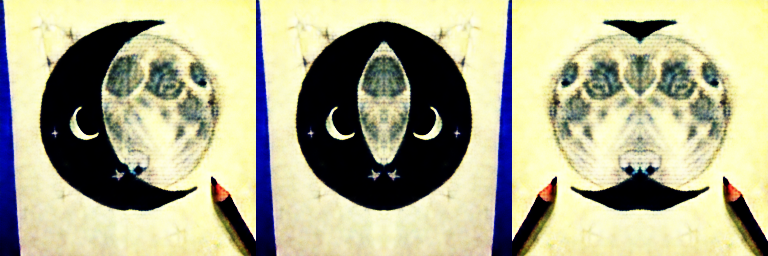

Status: ETR=0:05:02.784348      ETA=0:21:01.601451      T=0:15:58.817102        Progress: 7600/10000    RATE=7.93/s

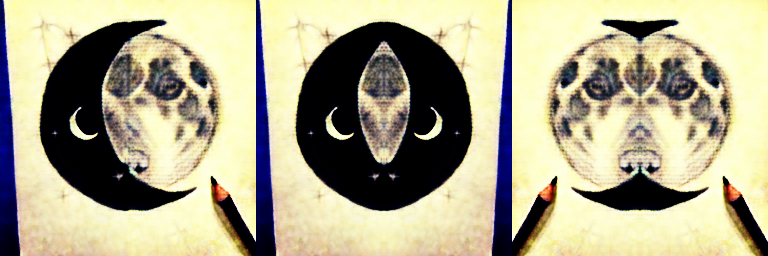

Status: ETR=0:04:37.551096      ETA=0:21:01.595890      T=0:16:24.044794        Progress: 7800/10000    RATE=7.93/s

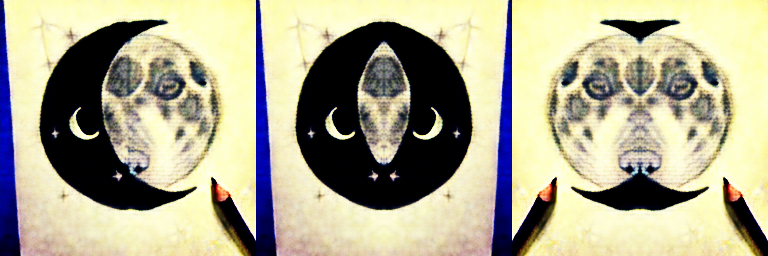

Status: ETR=0:04:12.317800      ETA=0:21:01.589000      T=0:16:49.271200        Progress: 8000/10000    RATE=7.93/s

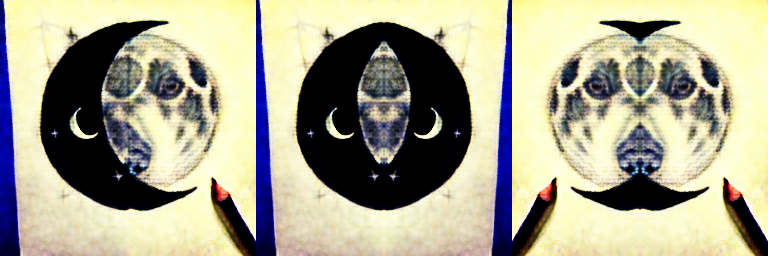

Status: ETR=0:03:47.083844      ETA=0:21:01.576912      T=0:17:14.493068        Progress: 8200/10000    RATE=7.93/s

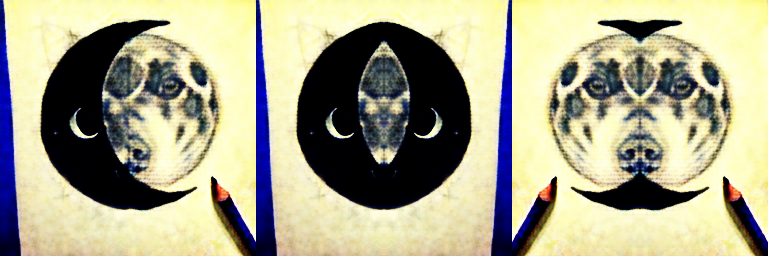

Status: ETR=0:03:21.851065      ETA=0:21:01.569156      T=0:17:39.718091        Progress: 8400/10000    RATE=7.93/s

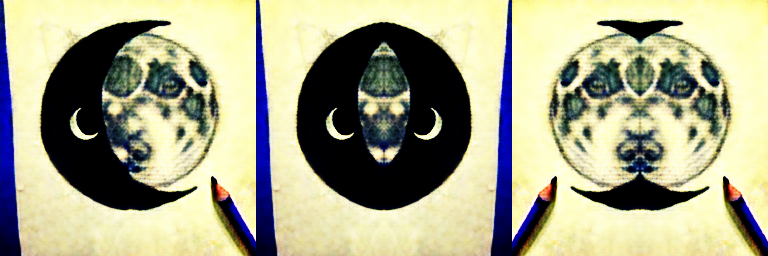

Status: ETR=0:02:56.617342      ETA=0:21:01.552443      T=0:18:04.935101        Progress: 8600/10000    RATE=7.93/s

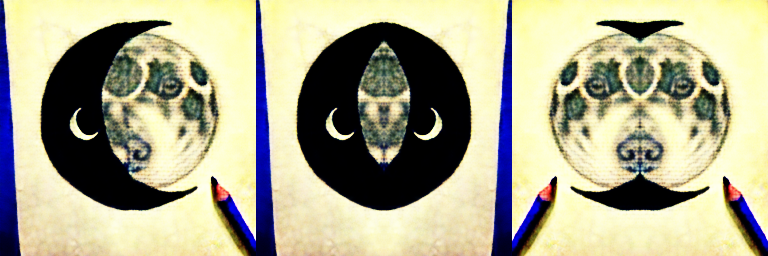

Status: ETR=0:02:31.384544      ETA=0:21:01.537870      T=0:18:30.153326        Progress: 8800/10000    RATE=7.93/s

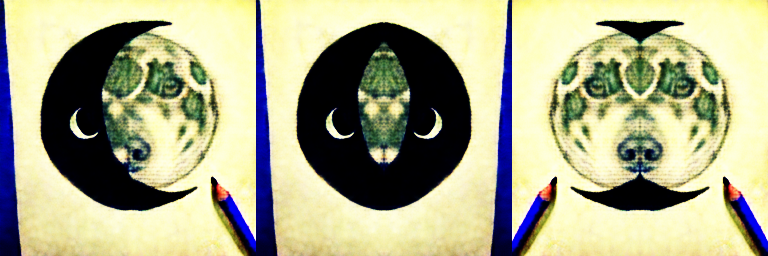

Status: ETR=0:02:06.152617      ETA=0:21:01.526172      T=0:18:55.373555        Progress: 9000/10000    RATE=7.93/s

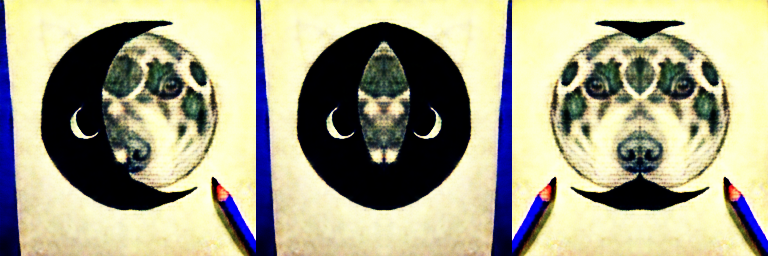

Status: ETR=0:01:40.921653      ETA=0:21:01.520667      T=0:19:20.599014        Progress: 9200/10000    RATE=7.93/s

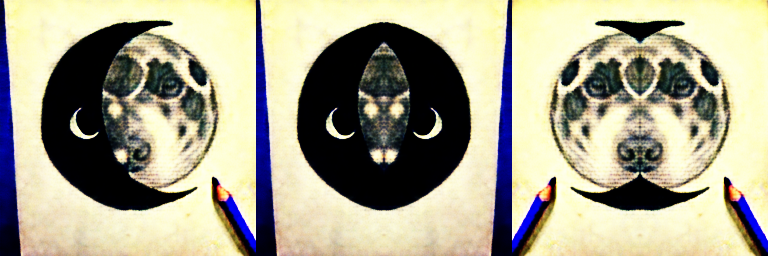

Status: ETR=0:01:15.691037      ETA=0:21:01.517276      T=0:19:45.826239        Progress: 9400/10000    RATE=7.93/s

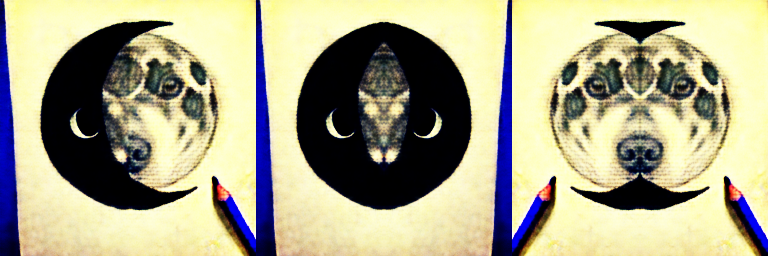

Status: ETR=0:00:50.461021      ETA=0:21:01.525515      T=0:20:11.064494        Progress: 9600/10000    RATE=7.93/s

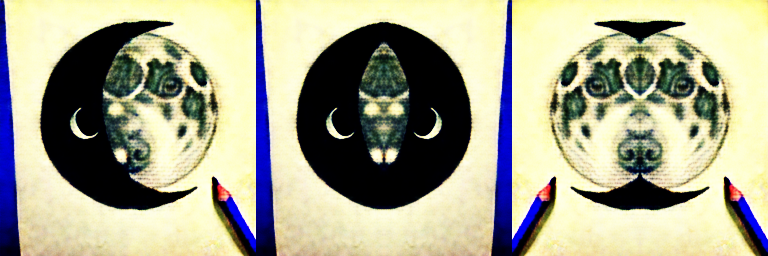

Status: ETR=0:00:25.230394      ETA=0:21:01.519724      T=0:20:36.289330        Progress: 9800/10000    RATE=7.93/s

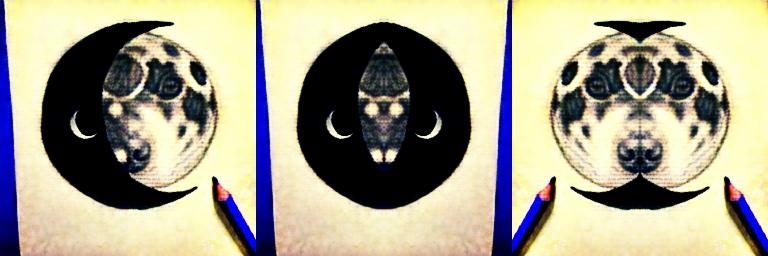

Status: ETR=0:00:00.126152      ETA=0:21:01.516411      T=0:21:01.390259        Progress: 9999/10000    RATE=7.93/s

In [12]:
NUM_ITER=10000

#Set the minimum and maximum noise timesteps for the dream loss (aka score distillation loss)
s.max_step=MAX_STEP=990
s.min_step=MIN_STEP=10 

display_eta=rp.eta(NUM_ITER, title='Status')

DISPLAY_INTERVAL = 200

print('Every %i iterations we display an image in the form [image_a, image_b], where'%DISPLAY_INTERVAL)
print('    image_a = (the right-side up image)')
print('    image_b = (image_a, but upside down)')
print()
print('Interrupt the kernel at any time to return the currently displayed image')
print('You can run this cell again to resume training later on')
print()
print('Please expect this to take quite a while to get good images (especially on the slower Colab GPU\'s)! The longer you wait the better they\'ll be')

try:
    for iter_num in range(NUM_ITER):
        display_eta(iter_num) #Print the remaining time

        preds=[]
        for label,learnable_image,weight in rp.random_batch(list(zip(labels,learnable_images,weights)), batch_size=1):
            pred=s.train_step(
                label.embedding,
                learnable_image()[None],

                #PRESETS (uncomment one):
                noise_coef=.1*weight,guidance_scale=60,#10
                # noise_coef=0,image_coef=-.01,guidance_scale=50,
                # noise_coef=0,image_coef=-.005,guidance_scale=50,
                # noise_coef=.1,image_coef=-.010,guidance_scale=50,
                # noise_coef=.1,image_coef=-.005,guidance_scale=50,
                # noise_coef=.1*weight, image_coef=-.005*weight, guidance_scale=50,
            )
            preds+=list(pred)

        with torch.no_grad():
            if iter_num and not iter_num%(DISPLAY_INTERVAL*50):
                #Wipe the slate every 50 displays so they don't get cut off
                from IPython.display import clear_output
                clear_output()

            if not iter_num%DISPLAY_INTERVAL:
                im = get_display_image()
                ims.append(im)
                rp.display_image(im)

        optim.step()
        optim.zero_grad()
except KeyboardInterrupt:
    print()
    print('Interrupted early at iteration %i'%iter_num)
    im = get_display_image()
    ims.append(im)
    rp.display_image(im)

Base Image:


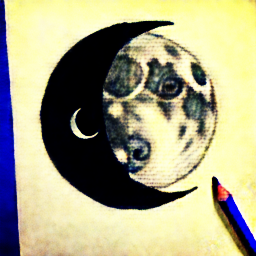

Mirrored Left:


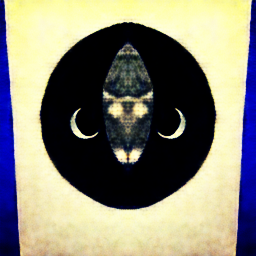

Mirrored Right:


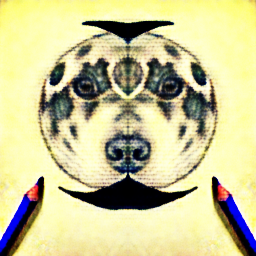

In [15]:
print('Base Image:')
rp.display_image(rp.as_numpy_image(learnable_image_a()))

print('Mirrored Left:')
rp.display_image(rp.as_numpy_image(learnable_image_b()))

print('Mirrored Right:')
rp.display_image(rp.as_numpy_image(learnable_image_c()))

In [17]:
def save_run(name):
    folder="untracked/flippy_illusion_runs/%s"%name
    if rp.path_exists(folder):
        folder+='_%i'%time.time()
    rp.make_directory(folder)
    ims_names=['ims_%04i.png'%i for i in range(len(ims))]
    with rp.SetCurrentDirectoryTemporarily(folder):
        rp.save_images(ims,ims_names,show_progress=True)
    print()
    print('Saved timelapse to folder:',repr(folder))
    
# save_run('-'.join(prompts)) #You can give it a good custom name if you want!
save_run('cat-dog-moon') #You can give it a good custom name if you want!

Saving Images: ETR=0:00:20.867934       ETA=0:01:26.949723      T=0:01:06.081790        Progress: 76/100        RATE=1.15/srp.save_images: Done! Saved 50 images in 0.453 seconds

Saved timelapse to folder: 'untracked/flippy_illusion_runs/cat-dog-moon_1790302757'
